In [1]:
using Plots
using DelimitedFiles
using ClusteringToMATo

[ Info: Precompiling ClusteringToMaTo [a174fcc0-226c-4228-9356-9cf23f81b616]


## Read data

In [2]:
toy = readdlm(joinpath("..", "ToMATo", "inputs", "toy_example_w_density.txt"))
points = collect(toy')

3×10000 Matrix{Float64}:
    0.392345     5.40588     0.215228  …     2.99077     1.11412     5.19651
    1.24778      2.40142     1.26093         7.13162     8.71054     7.12939
 1875.0       4250.0      1525.0          3450.0      1825.0      3525.0

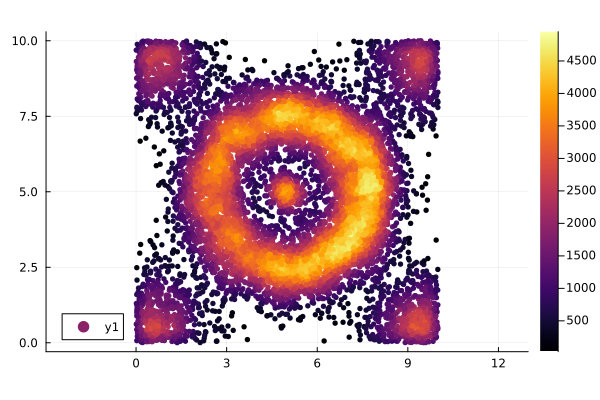

In [3]:
scatter( points[1,:], points[2,:], aspect_ratio = 1, 
         ms = 3, marker_z = points[3,:], palette = :jet, markerstrokewidth=0)

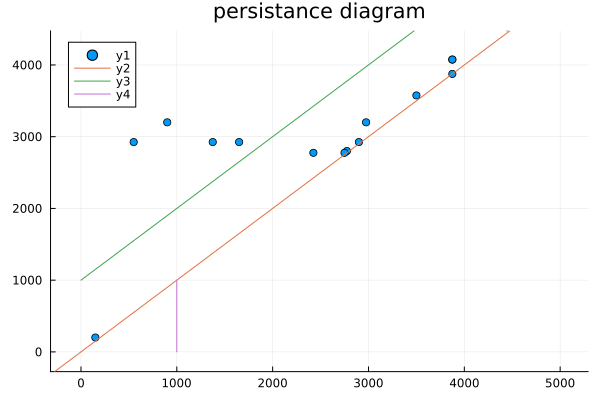

In [6]:
τ = Inf
radius = 0.25

labels, intervals = data2clust(points[1:2,:], points[3,:], radius, τ)

pd = [v for v in values(intervals) if isfinite(v[2])]
birth = getindex.(pd,1)
death = getindex.(pd,2)
p = plot(title = "persistance diagram")
scatter!(p, birth, death)
bmin, bmax = extrema(getindex.(pd,1))
dmin, dmax = extrema(getindex.(pd,2))
beps = 0.1 * (bmax-bmin) 
deps = 0.1 * (dmax-dmin)
xlims!(p, (bmin-beps,bmax+beps))
ylims!(p, (dmin-deps,dmax-deps))
plot!(p, x -> x)
τ = 1000
plot!(p, [0, bmax], [τ, bmax+τ])
plot!(p, [τ, τ], [τ, 0])
p

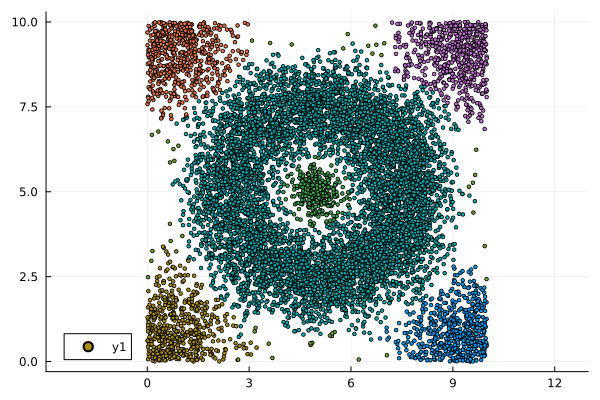

In [9]:
τ = 1000
labels, intervals = data2clust(points[1:2,:], points[3,:], radius, τ)
scatter( points[1,:], points[2,:], c = labels, ms=2, aspect_ratio = 1)

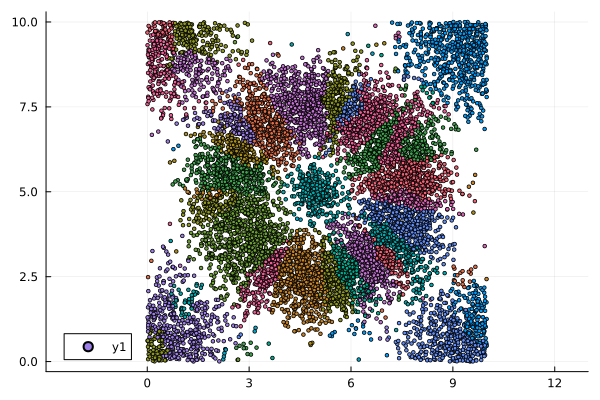

In [10]:
τ = 0
labels, intervals = data2clust(points[1:2,:], points[3,:], radius, τ)
scatter( points[1,:], points[2,:], c = labels, ms=2, aspect_ratio = 1)